Nome: Rafael de Oliveira Magalhães

N° USP: 12566122

# EP1

## Imports

In [1]:
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
import numpy as np
import pandas as pd
import os

## Methods

In [3]:
def plot_image(fig: np.array, title: str) -> None:
    """
        Method that displays an image
    """
    plt.figure(figsize=(10,10))
    plt.imshow(fig)
    plt.title(title)
    plt.axis('off')
    plt.show()

In [4]:
def display_images_class(archive_metadata: str, image_directory: str, class_number: int) -> None:
    """
        class_number: Class number. The numbers corresponding to each class can be seen through the 'classes' method
    
        ------------------------------------
    
        Displays all images of a given class
    """
    if class_number < 0 or class_number > 9 or not isinstance(class_number, int):
        print("Número da classe inválido, passe um número entre 0 e 9.")
    metadata = pd.read_csv(archive_metadata)
    prefix = metadata.iloc[class_number]['Prefixo dos Arquivos']
    class_name = metadata.iloc[class_number]['Nome da Classe']
    cont = 1
    for name_archive in os.listdir(image_directory):
        if prefix in name_archive:
            path_image = os.path.join(image_directory, name_archive)
            image = imread(path_image)
            plot_image(image, class_name + f" - {cont}")
            cont += 1

In [1]:
def classes(archive_metadata: str) -> None:
    """
        Displays a table with the classes and their respective image prefixes
    """
    metadata = pd.read_csv(archive_metadata)
    new_df = metadata[['Nome da Classe', 'Prefixo dos Arquivos']]
    display(new_df)

In [37]:
def list_shape_images(directory: str) -> None:
    """
        Returns a list of the dimensions of the images in the directory
    """
    list_shapes = []
    for name_archive in os.listdir(directory):
        path_image = os.path.join(directory, name_archive)
        image = imread(path_image)
        shape = image.shape
        if shape not in list_shapes:
            list_shapes.append(shape)
    return list_shapes

In [38]:
def size_directory(directory: str) -> int:
    """
        Returns the total size of the directory in MB
    """
    size = 0
    for dirpath, _, filenames in os.walk(directory):
        for filename in filenames:
            filepath = os.path.join(dirpath, filename)
            size += os.path.getsize(filepath)
    size_mb = size // (1024 * 1024)  
    return size_mb

In [41]:
def display_summary_table(archive_metadata: str, directory_images: str) -> None:
    """
        Displays a summary table of the images in the directory and metadata file
    """
    metadata = pd.read_csv(archive_metadata)
    classes = metadata['Nome da Classe'].values
    images = metadata['Total de Amostras'].values
    total_images = sum(images)
    total_class = len(classes)
    str_classes = classes[0] + "; "
    for i in range(1, len(classes)):
        str_classes += classes[i] + "; "
    size_images = size_directory(directory_images)
    list_shapes = list_shape_images(directory_images)
    shapes = ""
    for tuplee in list_shapes:
        lin, col, dim = tuplee
        shapes += f"{lin} linhas x {col} colunas; "
    print("======================================================================")
    print("Tabela Global Sumária:")
    print(f"* Nome das classes: {str_classes}")
    print(f"* Número de classes: {total_class}")
    print(f"* Número de imagens: {total_images}")
    print(f"* Tamanho da base: {size_images} MB")
    print(f"* Resolução das imagens: {shapes}")
    print("======================================================================")

In [21]:
def display_detailed_table(archive_metadata: str) -> None:
    """
        Displays a detailed table based on the metadata file
    """
    metadata = pd.read_csv(archive_metadata)
    pd.set_option('display.max_columns', None) 
    pd.set_option('display.max_rows', None)  
    pd.set_option('display.width', None) 
    pd.set_option('display.max_colwidth', None)  
    display(metadata)

## Examples of use

In [3]:
classes("metadados.csv")

,Nome da Classe,Prefixo dos Arquivos
0,Caneta,caneta
1,Grampeador,grampeador
2,Tesoura,tesoura
3,Régua,regua
4,Cubo Mágico,cubo
5,Cabo,cabo
6,Carregador,carregador
7,Prendedor,prendedor
8,Caderno,caderno
9,Rolo de Fita,fita


In [42]:
display_summary_table("metadados.csv", "Imagens/")

Tabela Global Sumária:
* Nome das classes: Caneta; Grampeador; Tesoura; Régua; Cubo Mágico; Cabo; Carregador; Prendedor; Caderno; Rolo de Fita; 
* Número de classes: 10
* Número de imagens: 320
* Tamanho da base: 515 MB
* Resolução das imagens: 3120 linhas x 4160 colunas; 


In [22]:
display_detailed_table("metadados.csv")

,Nome da Classe,Número de Objetos,Variações de fundo,Variações de Iluminação,Número de Repetições,Total de Amostras,Prefixo dos Arquivos,Observações
0,Caneta,5,"4 (mesa amarela, mesa marrom, pia preta, azulejo branco)","4 (todas as variações do produto cartesiano {dentro de casa, fora de casa} X {de dia, de Noite}",3,32,caneta,Todas as variações de fundo possuem amostram tanto de dia quanto de noite. Apenas o azulejo branco corresponde a um ambiente de fora de casa.
1,Grampeador,5,"4 (mesa amarela, mesa marrom, pia preta, azulejo branco)","4 (todas as variações do produto cartesiano {dentro de casa, fora de casa} X {de dia, de Noite}",3,32,grampeador,Todas as variações de fundo possuem amostram tanto de dia quanto de noite. Apenas o azulejo branco corresponde a um ambiente de fora de casa.
2,Tesoura,5,"4 (mesa amarela, mesa marrom, pia preta, azulejo branco)","4 (todas as variações do produto cartesiano {dentro de casa, fora de casa} X {de dia, de Noite}",3,32,tesoura,Todas as variações de fundo possuem amostram tanto de dia quanto de noite. Apenas o azulejo branco corresponde a um ambiente de fora de casa.
3,Régua,5,"4 (mesa amarela, mesa marrom, pia preta, azulejo branco)","4 (todas as variações do produto cartesiano {dentro de casa, fora de casa} X {de dia, de Noite}",3,32,regua,Todas as variações de fundo possuem amostram tanto de dia quanto de noite. Apenas o azulejo branco corresponde a um ambiente de fora de casa.
4,Cubo Mágico,5,"4 (mesa amarela, mesa marrom, pia preta, azulejo branco)","4 (todas as variações do produto cartesiano {dentro de casa, fora de casa} X {de dia, de Noite}",3,32,cubo,Todas as variações de fundo possuem amostram tanto de dia quanto de noite. Apenas o azulejo branco corresponde a um ambiente de fora de casa.
5,Cabo,5,"4 (mesa amarela, mesa marrom, pia preta, azulejo branco)","4 (todas as variações do produto cartesiano {dentro de casa, fora de casa} X {de dia, de Noite}",3,32,cabo,Todas as variações de fundo possuem amostram tanto de dia quanto de noite. Apenas o azulejo branco corresponde a um ambiente de fora de casa.
6,Carregador,5,"4 (mesa amarela, mesa marrom, pia preta, azulejo branco)","4 (todas as variações do produto cartesiano {dentro de casa, fora de casa} X {de dia, de Noite}",3,32,carregador,Todas as variações de fundo possuem amostram tanto de dia quanto de noite. Apenas o azulejo branco corresponde a um ambiente de fora de casa.
7,Prendedor,5,"4 (mesa amarela, mesa marrom, pia preta, azulejo branco)","4 (todas as variações do produto cartesiano {dentro de casa, fora de casa} X {de dia, de Noite}",3,32,prendedor,Todas as variações de fundo possuem amostram tanto de dia quanto de noite. Apenas o azulejo branco corresponde a um ambiente de fora de casa.
8,Caderno,5,"4 (mesa amarela, mesa marrom, pia preta, azulejo branco)","4 (todas as variações do produto cartesiano {dentro de casa, fora de casa} X {de dia, de Noite}",3,32,caderno,Todas as variações de fundo possuem amostram tanto de dia quanto de noite. Apenas o azulejo branco corresponde a um ambiente de fora de casa.
9,Rolo de Fita,5,"4 (mesa amarela, mesa marrom, pia preta, azulejo branco)","4 (todas as variações do produto cartesiano {dentro de casa, fora de casa} X {de dia, de Noite}",3,32,fita,Todas as variações de fundo possuem amostram tanto de dia quanto de noite. Apenas o azulejo branco corresponde a um ambiente de fora de casa.


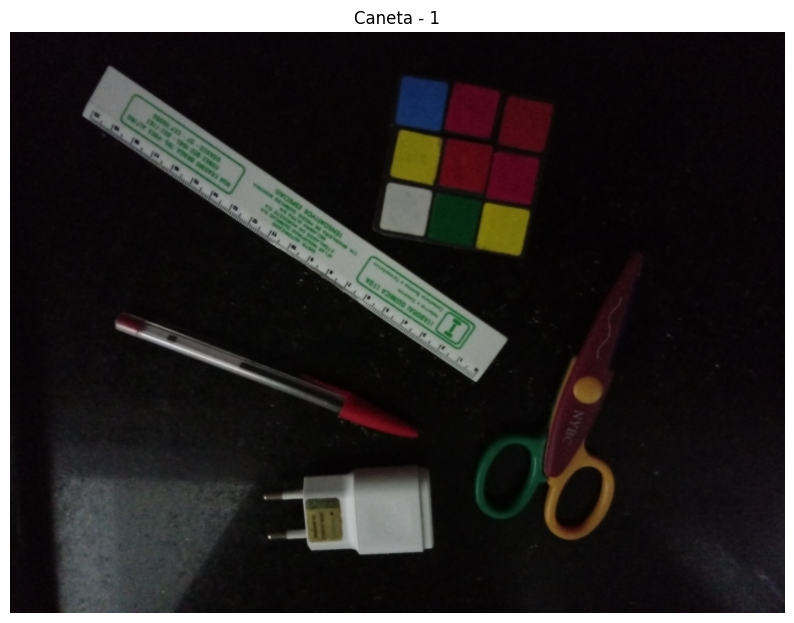

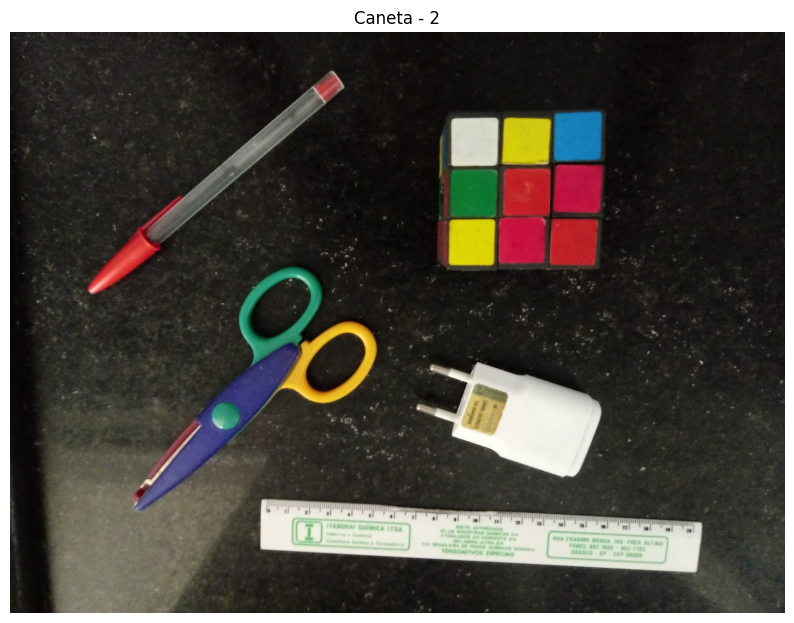

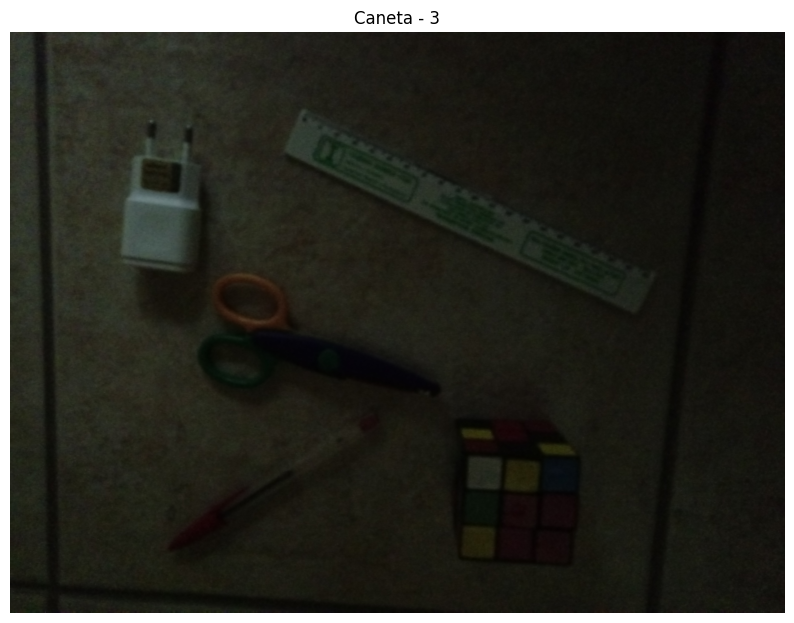

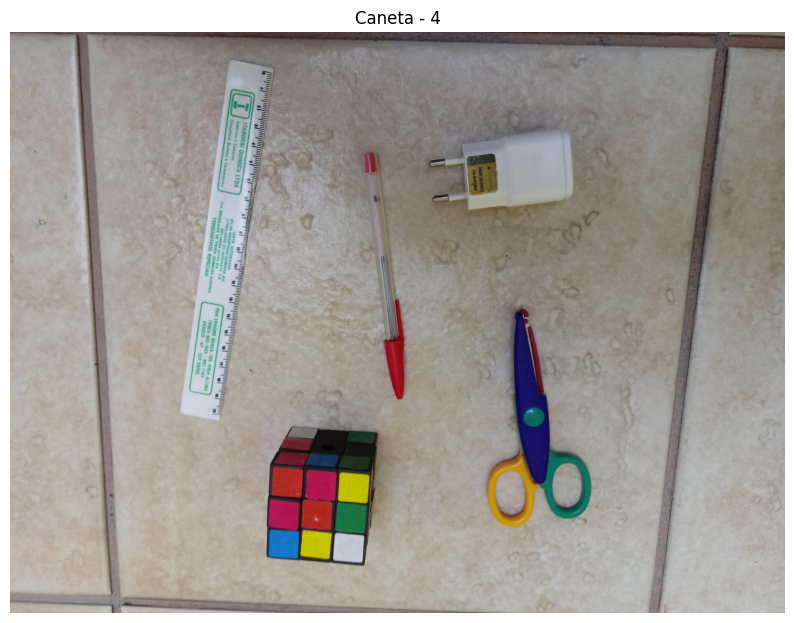

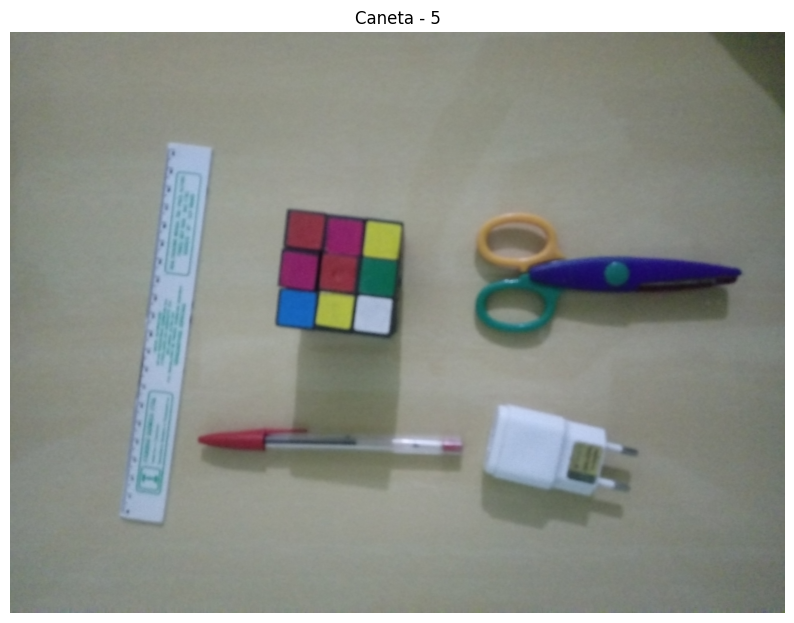

...

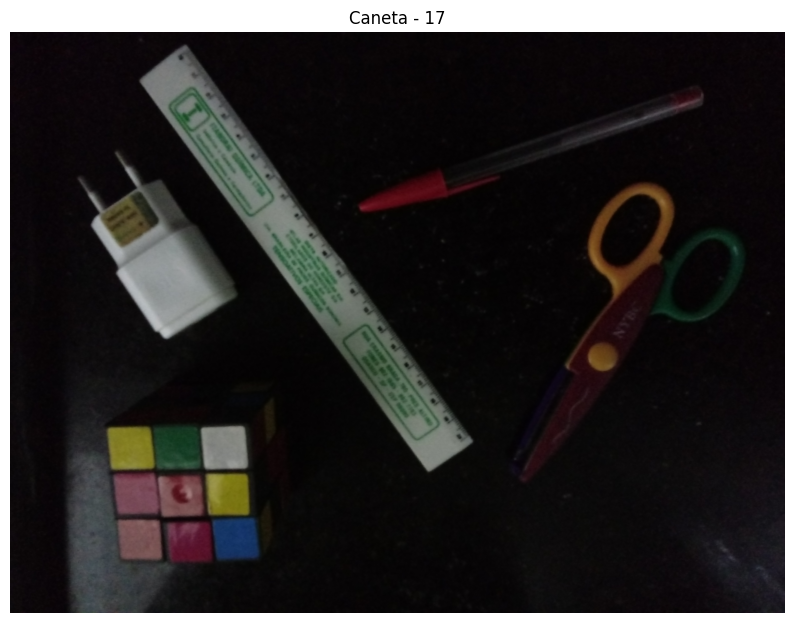

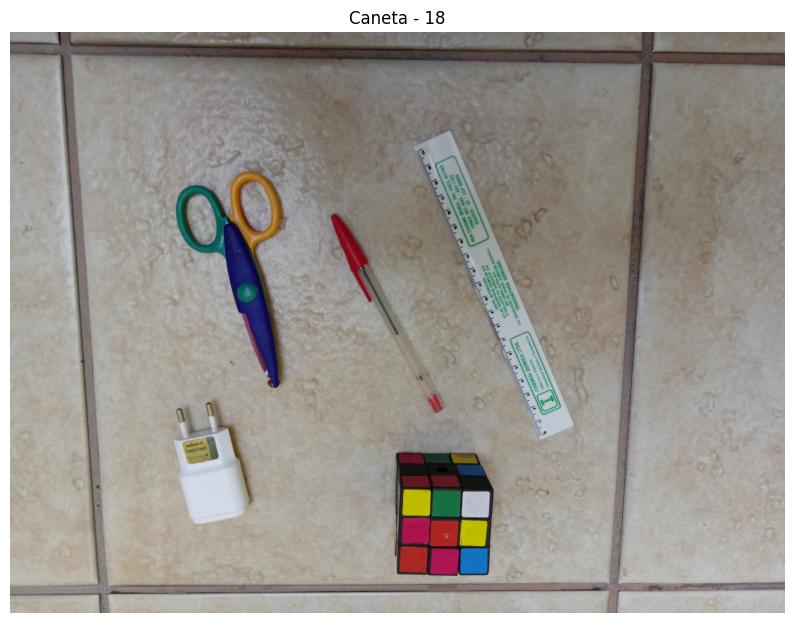

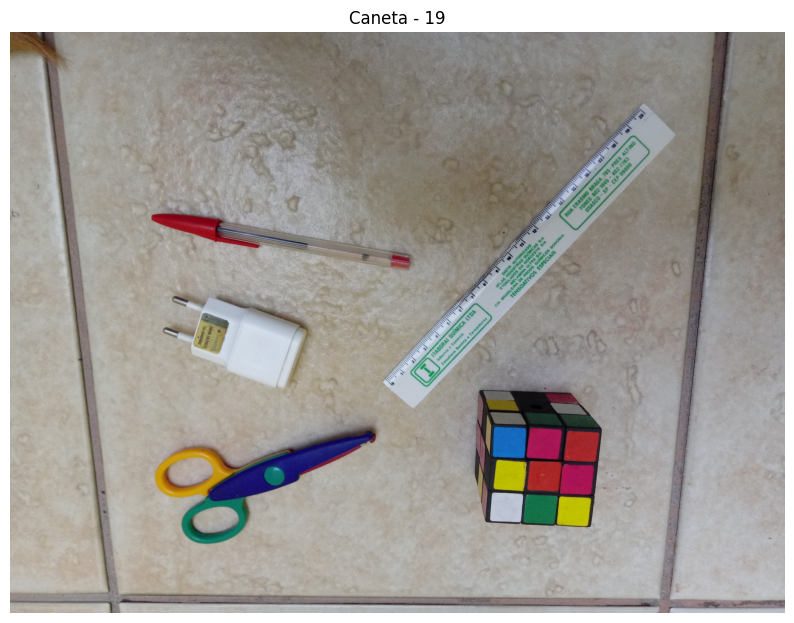

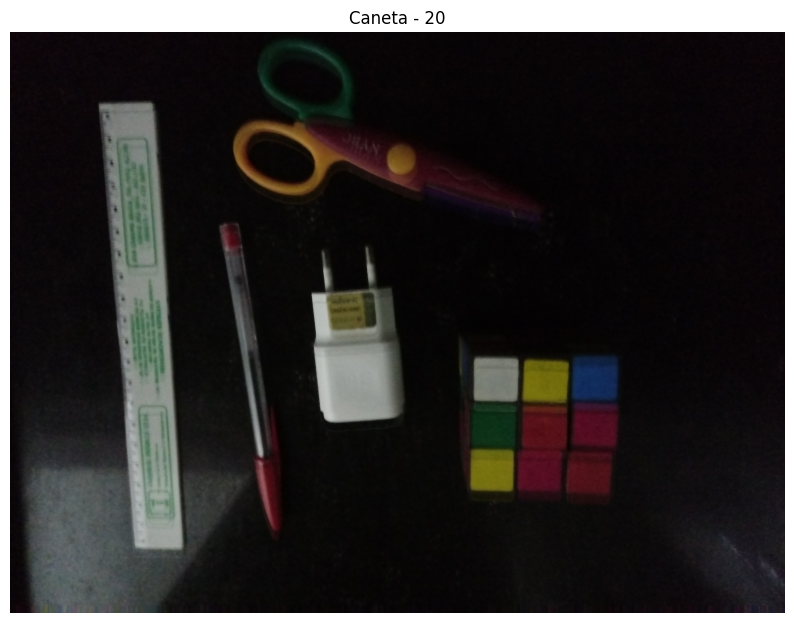

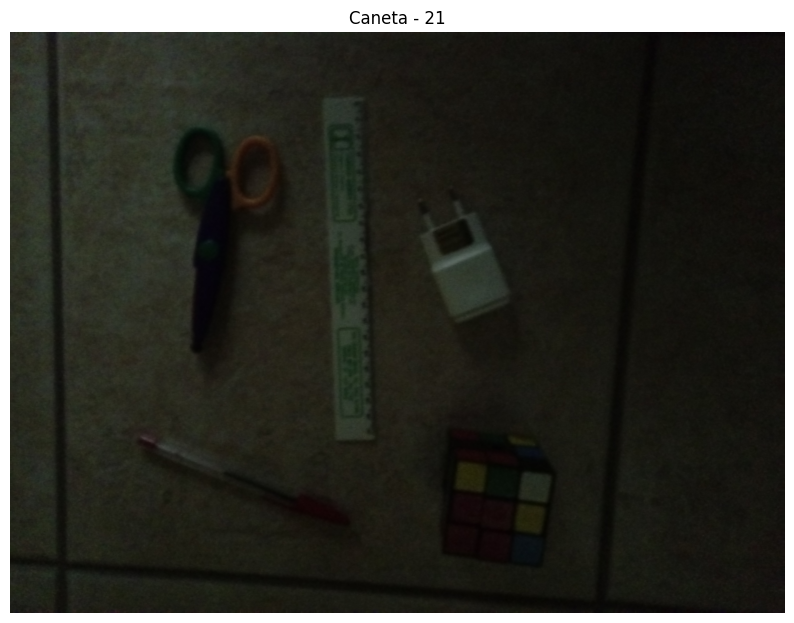

In [5]:
display_images_class("metadados.csv", "Imagens/", 0)